# Musical Instrument Classification
In this notebook I explore musical instrument classification from audio using transfer learning leveraging [VGG-19](https://www.tensorflow.org/api_docs/python/tf/keras/applications/VGG19). The following is covered:
* Downloading samples from YouTube
* Reading sections of audio files into multiple sample arrays
* Generating mel-spectrograms for each sample
* Extracting 128-dimensional features from the mel-spectrograms using VGG-19
* Building test/train split from features array
* Classification with Linear Support Vector Machine (LinearSVM)

## Importing Required Libraries

In [243]:
from __future__ import unicode_literals
import youtube_dl
import os
import librosa
import matplotlib.pyplot as plt
import numpy as np
from skimage import io
from skimage.transform import resize
from keras.applications.vgg19 import VGG19
from keras.preprocessing import image
from keras.applications.vgg19 import preprocess_input
from keras.models import Model
from sklearn.model_selection import train_test_split
from sklearn.svm import LinearSVC
from sklearn.metrics import accuracy_score, confusion_matrix, plot_confusion_matrix
import IPython.display as ipd

## Data Collection

### Dictionaries and Urls
These lists and dictionaries are used at various stages to access and classify audio data. The audio files are downloaded into a folder structure based on the 'categories' (classes we will be classifying) like this:<br><br>
![Download Folder Structure](img/folder_structure.png)
<br><br>
**Note** The audio files for the YouTube videos listed here will require ~4GB disk space.

In [178]:
class_names = [
    "Piano",
    "Guitar",
    "Cello",
    "Violin",
    "Drums",
    "Percussion"
]

categories_to_ints = {
    "Piano":0,
    "Guitar":1,
    "Cello":2,
    "Violin":3,
    "Drums":4,
    "Percussion":5
}

ints_to_categories = {
    0:"Piano",
    1:"Guitar",
    2:"Cello",
    3:"Violin",
    4:"Drums",
    5:"Percussion"
}

piano_urls = [
    'https://www.youtube.com/watch?v=WJ3-F02-F_Y',
    'https://www.youtube.com/watch?v=IGM1T0t7qts'
]

guitar_urls = [
    'https://www.youtube.com/watch?v=2w7khl1lixQ',
    'https://www.youtube.com/watch?v=nONbrv2Lylg',
    'https://www.youtube.com/watch?v=UJh0wpFFZBc',
    'https://www.youtube.com/watch?v=mO6nH_bPCkk'
]

cello_urls = [
    'https://www.youtube.com/watch?v=HdFXOtkaY-w'
]

violin_urls = [
    'https://www.youtube.com/watch?v=myXOrVv-fNk',
    'https://www.youtube.com/watch?v=iEBX_ouEw1I'
]

drums_urls = [
    'https://www.youtube.com/watch?v=KdmrxZTWSds',
    'https://www.youtube.com/watch?v=4VeTn1_9TEY',
    'https://www.youtube.com/watch?v=Xj5YAi9Efi4'
]

percussion_urls = [
    'https://www.youtube.com/watch?v=MUzXN6XyFfA',
    'https://www.youtube.com/watch?v=2jXxO9YO4Ig'
]

data_urls = [
    piano_urls,
    guitar_urls,
    cello_urls,
    violin_urls,
    drums_urls,
    percussion_urls
]

### Download

In [ ]:
def download_clip(url, file_prefix):
    ydl_opts = {
        'format': 'bestaudio/best',
        'outtmpl': file_prefix + '%(id)s.%(ext)s',        
        'noplaylist' : True, 
        'postprocessors': [{
            'key': 'FFmpegExtractAudio',
            'preferredcodec': 'wav',
            'preferredquality': '192', }]
    }
    try:
        with youtube_dl.YoutubeDL(ydl_opts) as ydl:
            ydl.cache.remove()
            info_dict = ydl.extract_info(url, download=False)
            ydl.prepare_filename(info_dict)
            ydl.download([url])
            return True
    except Exception:
        print('Failed to download clip at url: ', url)
        return False

In [ ]:
def download_all_clips(data_urls, ints_to_categories):
    for i in range(len(data_urls)):
        prefix = f'audio-data/wav/{ints_to_categories[i]}/'
        for url in data_urls[i]:
            download_clip(url, prefix)

In [ ]:
download_all_clips(data_urls=data_urls, ints_to_categories=ints_to_categories)

## Data Ingestion
Audio files are loaded, split into separate examples of equal length, and mel spectrograms generated using [librosa](https://librosa.org/). A mel spectrogram is a spectrogram where the frequencies are converted to the mel scale, which is intended to more closely reflect how humans hear (ie; we are better at detecting differences in lower frequencies than higher frequencies). The spectrograms are saved as .png files with a size of 385x124.

![Image Folder Structure](img/img_folder.png)

Here are a few examples:

![Piano](img/piano_spec.png)
<center>Piano</center>

![Percussion](img/perc_spec.png)
<center>Percussion</center>

![Drums](img/drums_spec.png)
<center>Drums</center>

![Violin](img/violin_spec.png)
<center>Violin</center>


You can clearly see differences in the spectrogram characteristics for each instrument. These images are the basis for feature extraction using [VGG-19](https://www.tensorflow.org/api_docs/python/tf/keras/applications/VGG19) (a convolutional neural network with 19 layers). We load a pretrained version of the network trained on more than a million images from the ImageNet, and use it to extract features from the spectrogram images. Classification can then be learned on these features, in this case with a Linear Support Vector Machine model.

It may seem strange to classify audio based on images, but this approach has proven to yield good results when the number of classes is relatively low, and/or the dataset is small.

In [260]:
def get_clip_paths(dir):
    audio_wav_dir = f'audio-data/{dir}'
    dirs = [f for f in os.listdir(audio_wav_dir) if not f.startswith('.')]
    clip_paths = {}
    for dir in dirs:
        clip_paths[dir] = [os.path.join(audio_wav_dir, dir, p) 
                           for p in os.listdir(os.path.join(audio_wav_dir, dir)) 
                           if not p.startswith('.') and p.endswith('.wav')]
    return clip_paths

In [261]:
def get_img_paths(dir):
    audio_img_dir = f'audio-data/{dir}'
    dirs = [f for f in os.listdir(audio_img_dir) if not f.startswith('.')]
    img_paths = {}
    for dir in dirs:
        img_paths[dir] = [os.path.join(audio_img_dir, dir, p) 
                           for p in os.listdir(os.path.join(audio_img_dir, dir)) 
                          if not p.startswith('.')  and p.endswith('.png')]
    return img_paths

spectrogram_image adapted from [jonnor](https://stackoverflow.com/users/1967571/jonnor) on [StackOverflow](https://stackoverflow.com/questions/56719138/how-can-i-save-a-librosa-spectrogram-plot-as-a-specific-sized-image/57204349#57204349)

In [273]:
def scale_minmax(X, min=0.0, max=1.0):
    X_std = (X - X.min()) / (X.max() - X.min())
    X_scaled = X_std * (max - min) + min
    return X_scaled

def spectrogram_image(y, sr, filename, hop_length, n_mels):
    # use log-melspectrogram
    mels = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=n_mels,
                                          n_fft=hop_length*2, hop_length=hop_length)
    mels = np.log(mels + 1e-9) # add small number to avoid log(0)

    # min-max scale to fit inside 8-bit range
    img = scale_minmax(mels, 0, 255).astype(np.uint8)
    img = np.flip(img, axis=0) # put low frequencies at the bottom in image

    # save as PNG
    print(f'Saving PNG: {filename}')
    io.imsave(filename, img)

In [ ]:
# settings
# hop_length = number of samples per time-step in spectrogram
# n_mels = number of bins in spectrogram. Height of image
# time_steps = number of time-steps. Width of image = 128*3

def create_spectrograms(clip_paths, max_img_per_category = 50, hop_length = 512, n_mels=128, time_steps=384):
    duration = 10.0
    clip_paths = get_clip_paths('wav')
    for category in categories_to_ints:
        if category not in clip_paths:
            continue
        clips = clip_paths[category]
        n_imgs_created = 0
        for path in clips:
            if(n_imgs_created > max_img_per_category):
                    break
                    
            img_path = path.replace("/wav/", "/img/").replace(".wav", "")
            img_cat_path = f'{img_path.split(category)[0]}{category}'
            if not os.path.exists(img_cat_path):
                os.makedirs(img_cat_path)
                
            y, sr = librosa.load(path=path, mono=True, offset = 5, duration = 300)
            length_samples = time_steps*hop_length
            max_img = min(int((len(y)/length_samples))-1, int(max_img_per_category/len(clips))) 
            start_sample = 0
            for i in range(max_img):
                # extract a fixed length window
                window = y[start_sample:start_sample+length_samples]
                spectrogram_image(y=window, sr=sr, filename=f'{img_path}_{i}.png', hop_length=hop_length, n_mels=n_mels)
                start_sample+=length_samples
                n_imgs_created+=1
                if(n_imgs_created >= max_img_per_category):
                    break

In [264]:
def image_counts():
    img_paths = get_img_paths('img')
    total = 0
    for category in categories_to_ints:
        if category not in img_paths:
            continue
        imgs = img_paths[category]
        total += len(imgs)
        print(f'{category} images count: {len(imgs)}')
    print(f'TOTAL images count: {total}')

In [ ]:
%%time
create_spectrograms()

Here we can see the total dataset size is quite small (as limited by the parameter max_img_per_category = 50 in create_spectrograms method). This can be scaled up as necessary – a few hundred spectrograms per class would be reasonable – if more categories and source files were added.

In [265]:
image_counts()

Piano images count: 50
Guitar images count: 48
Cello images count: 32
Violin images count: 47
Drums images count: 48
Percussion images count: 50
TOTAL images count: 275


## Extracting Features with VGG-19

In [206]:
base_model = VGG19(weights='imagenet')
model = Model(inputs=base_model.input, outputs=base_model.get_layer('flatten').output)

def get_features(img_path):
    img = io.imread(fname=img_path, as_gray=True)
    img = resize(img, output_shape=(224,224), anti_aliasing=True, preserve_range=True)
    x = np.array([img])
    x = np.repeat(x[..., np.newaxis], 3, -1) #vgg-19 expects 3 color channels, repeat BW pixel values
    x = preprocess_input(x)
    flatten = model.predict(x)
    return list(flatten[0])

## Classification

### Train-Test Split

In [228]:
def build_train_test_split(test_size=0.30, random_state=42):
    img_paths = get_img_paths()
    for category in categories_to_ints:
        if category not in img_paths:
            continue
        for img in img_paths[category]:
            X.append(get_features(img))
            y.append(categories_to_ints[category])
    return train_test_split(X, y, test_size=test_size, random_state=random_state, stratify=y)

In [229]:
%%time
X = []
y = []
X_train, X_test, y_train, y_test = build_train_test_split()

CPU times: user 2min 32s, sys: 797 ms, total: 2min 33s
Wall time: 2min 33s


### LinearSVM Classifier

#### Train and Test
The LinearSVM classifier achieves excellent results in this scenario, achieving ~98-99% accuracy on the test set. It would be very interesting to see how this performs as the number of classes and test set size increase.

Accuracy on Test Set 98.8%


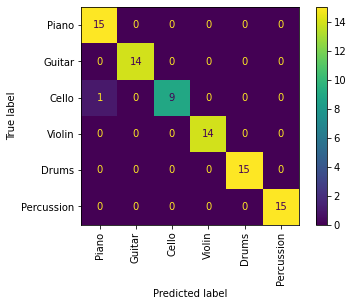

In [242]:
clf = LinearSVC(random_state=0, tol=1e-5)
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)

acc = accuracy_score(y_test, y_pred)

print(f'Accuracy on Test Set {"{0:.1%}".format(acc)}')
plot_confusion_matrix(clf, X_test, y_test, display_labels=class_names, xticks_rotation='vertical');

#### Play With The Model
Now we can classify several audio clips the model has never seen. As expected, the classifications are correct nearly all of the time. To try your own, just put .wav audio files in the 'audio-data/wav_hidden' folder and run the following code.

In [270]:
play_clips_path = 'audio-data/wav_hidden'
play_sample_clips = [os.path.join(play_clips_path, p) 
                for p in os.listdir(play_clips_path) if not p.startswith('.') and p.endswith('.wav')]
for c in play_sample_clips:
    ipd.display(ipd.Audio(c))

In [272]:
X_play = []
img_paths_play = []
for c in play_sample_clips:
    y, sr = librosa.load(c)
    p = f'{c.replace(".wav", ".png")}'
    img_paths_play.append(p)
    spectrogram_image(y=y, sr=sr, filename=p, hop_length=512, n_mels=128)
    
X_play = [get_features(img) for img in img_paths_play]
predictions = clf.predict(X_play)

for i in range(len(predictions)):
    print(f'Predicted class for Sample {i}: {ints_to_categories[predictions[i]]}')

Saving PNG: audio-data/wav_hidden/Sample(06).png
Saving PNG: audio-data/wav_hidden/Sample(01).png
Saving PNG: audio-data/wav_hidden/Sample(02).png
Saving PNG: audio-data/wav_hidden/Sample(03).png
Saving PNG: audio-data/wav_hidden/Sample(04).png
Saving PNG: audio-data/wav_hidden/Sample(05).png
Predicted class for Sample 0: Percussion
Predicted class for Sample 1: Cello
Predicted class for Sample 2: Drums
Predicted class for Sample 3: Piano
Predicted class for Sample 4: Piano
Predicted class for Sample 5: Violin
